# Preprocessing: Pipeline Setup
* Grayscale morphology: markers and masks
* Grayscale morphology: H-domes

In [1]:
using Pkg
Pkg.activate("../notebooks/calval/")
Pkg.add(;name="IceFloeTracker", rev="main") # potentially lets me use the dev version!
using Images
using IceFloeTracker
using CSV
Pkg.add("CairoMakie")
using CairoMakie
using DataFrames
using Peaks

  Activating project at `~/Documents/research/calval_tgrs/notebooks/calval`
    Updating git-repo `https://github.com/WilhelmusLab/IceFloeTracker.jl.git`
    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
    Updating `~/Documents/research/calval_tgrs/notebooks/calval/Project.toml`
  [04643c7a] ~ IceFloeTracker v0.9.0 `https://github.com/WilhelmusLab/IceFloeTracker.jl.git#main` ⇒ v0.9.0 `https://github.com/WilhelmusLab/IceFloeTracker.jl.git#main`
    Updating `~/Documents/research/calval_tgrs/notebooks/calval/Manifest.toml`
  [04643c7a] ~ IceFloeTracker v0.9.0 `https://github.com/WilhelmusLab/IceFloeTracker.jl.git#main` ⇒ v0.9.0 `https://github.com/WilhelmusLab/IceFloeTracker.jl.git#main`
Precompiling project...
   2368.6 ms  ✓ Qt6ShaderTools_jll
   2660.7 ms  ✓ OpenCV_jll
    902.4 ms  ✓ Qt6Declarative_jll
  10894.6 ms  ✓ IceFloeTracker
  11073.6 ms  ✓ ImageFeatures
   9164.8 ms  ✓ OpenCV
  6 dependencies successfully precompiled in 15 seconds

In [2]:
Pkg.resolve()

  No Changes to `~/Documents/research/calval_tgrs/notebooks/calval/Project.toml`
  No Changes to `~/Documents/research/calval_tgrs/notebooks/calval/Manifest.toml`


In [3]:
df = DataFrame(CSV.File("../data/validation_dataset_testtrain_split.csv"));
df_training = copy(df[df.training,:]);
clear_sky_training_cases = df_training[df_training.cloud_fraction_manual .< 0.25  .&& (df_training.visible_sea_ice .== "yes"), [:case_number, :satellite]];

# Parameters and cloud mask

In [4]:
using IceFloeTracker: AbstractCloudMaskAlgorithm, PeronaMalikDiffusion
using IceFloeTracker: fill_holes

In [142]:
data_loader = Watkins2025GitHub(; ref="1d36f82a5cb337839ab039bffca8961a97241c22")
dataset = data_loader(c -> c.case_number == 6 && c.satellite == "terra");
case = first(dataset);

In [143]:
cloud_mask_settings = (
    prelim_threshold=53.0/255.,
    band_7_threshold=130.0/255.,
    band_2_threshold=169.0/255.,
    ratio_lower=0.0,
    ratio_offset=0.0,
    ratio_upper=0.53
)

cmask = LopezAcostaCloudMask(cloud_mask_settings...)

@kwdef struct Watkins2025CloudMask <: AbstractCloudMaskAlgorithm
    prelim_threshold::Float64 = 0.21
    band_7_threshold::Float64 = 0.51
    band_2_threshold::Float64 = 0.66
    ratio_lower::Float64 = 0.0
    ratio_offset::Float64 = 0.0
    ratio_upper::Float64 = 0.53
    marker_strel = strel_box((7,7))
    opening_strel = strel_diamond((3,3))
end


# use functor notation to define a function using the parameter struct
function (f::Watkins2025CloudMask)(img::AbstractArray{<:Union{AbstractRGB,TransparentRGB}})
    init_cloud_mask = LopezAcostaCloudMask(f.prelim_threshold,
                                           f.band_7_threshold,
                                           f.band_2_threshold,
                                           f.ratio_lower,
                                           f.ratio_offset,
                                           f.ratio_upper)(img)
    markers = opening(init_cloud_mask, f.marker_strel)
    reconstructed = mreconstruct(dilate, markers, init_cloud_mask, f.opening_strel)
    smoothed = opening(reconstructed, f.opening_strel)
    filled = fill_holes(smoothed)
    return filled
end

  0.100574 seconds (7.68 k allocations: 413.858 MiB, 16.76% gc time)


[ Info: Diffuse and sharpen the full image


  0.004140 seconds (8.59 k allocations: 8.113 MiB)


[ Info: Histogram adjustment


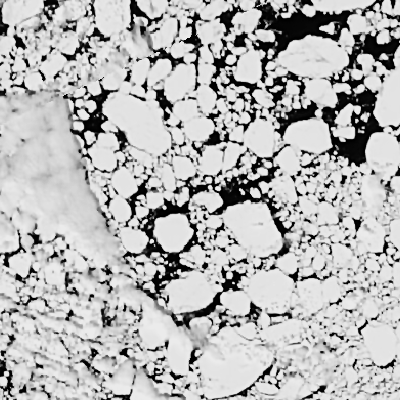

In [144]:
using IceFloeTracker: nonlinear_diffusion
new_cmask = Watkins2025CloudMask();
pmd_diff = PeronaMalikDiffusion(0.1, 0.1, 5, "exponential")

tc_img = RGB.(case.modis_truecolor)
fc_img = RGB.(case.modis_falsecolor)

land_mask = IceFloeTracker.create_landmask(case.modis_landmask, strel_diamond((3,3)))
cloud_mask = IceFloeTracker.create_cloudmask(fc_img, new_cmask)

tile_size_pixels = 200
minimum_ocean_pixels = 100^2 # setting for the simple tile filter

tiles = IceFloeTracker.get_tiles(tc_img, tile_size_pixels)

# Get list of tiles to process:
# just use a minimum value for land for now
filtered_tiles = filter(
    t -> sum(.!land_mask.dilated[t...]) > minimum_ocean_pixels, tiles)

# If desired, a mask can be made for the tiles included after filtering
tile_markers = zeros(size(cloud_mask))
for tile in filtered_tiles
    tile_markers[tile...] .= 1
end

@info "Diffuse and sharpen the full image"
# Image diffusion can be slow, so applying it only to the tiles in the filtered list
# speeds things up linearly (i.e. half the number of tiles takes half as long.)
# This does slightly change the result, as borders of tiles are not diffused.
tc_diffused_sharpened = deepcopy(tc_img)
@time begin
    for tile in filtered_tiles
        tc_diffused_sharpened[tile...] .= nonlinear_diffusion(deepcopy(tc_img)[tile...], pmd_diff) |> IceFloeTracker.unsharp_mask
    end
end

@info "Histogram adjustment"
# Things to prevent issues: the rblocks and cblocks not result in cutting the image into too small of pieces.
# 50 km - 100 km block seems okay. Done on the whole image as the algorithm is rather fast.
rblocks, cblocks = round.(Int64, size(tc_img) ./ tile_size_pixels)
rblocks = maximum((1, rblocks))
cblocks = maximum((1, cblocks))

@time adjust_histogram!(tc_diffused_sharpened, AdaptiveEqualization(clip=0.99, rblocks=rblocks, cblocks=cblocks, nbins=256))

enhanced_gray = Gray.(tc_diffused_sharpened)
# Increase the range from dark to bright
adjust_histogram!(enhanced_gray, ContrastStretching(slope=3.5))

# test = adjust_histogram(enhanced_gray, LinearStretching())

# Stretch from 0 to 1
# test = adjust_histogram(test, LinearStretching())
# # Adjust the histogram
# tc_diffused_sharpened .= tc_diffused_sharpened .* .! cloud_mask .* tile_markers

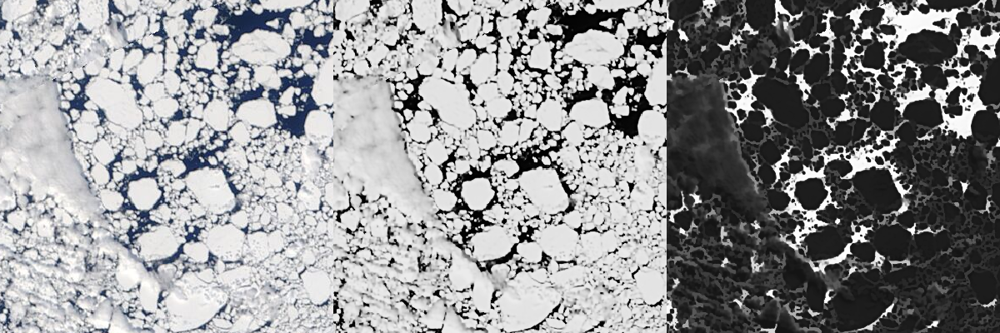

In [145]:
# Grayscale morphological operations
dilated_img = dilate(enhanced_gray, strel_diamond((5, 5)))
reconstructed_complement = clamp.(mreconstruct(
    dilate, complement.(dilated_img), complement.(enhanced_gray), strel_diamond((3, 3))), 0, 1);
mosaicview(tc_img, enhanced_gray, reconstructed_complement, nrow=1)

In [146]:
darken_mask = reconstructed_complement .- green.(tc_img) .> 0
reconstructed_complement[darken_mask] .= 1.2 .* reconstructed_complement[darken_mask];
percentile(vec(reconstructed_complement), 1)

0.0784313753247261

In [147]:
percentile(vec(equalized_gray_sharpened_reconstructed[darken_mask]), 95)

1.1435294151306152

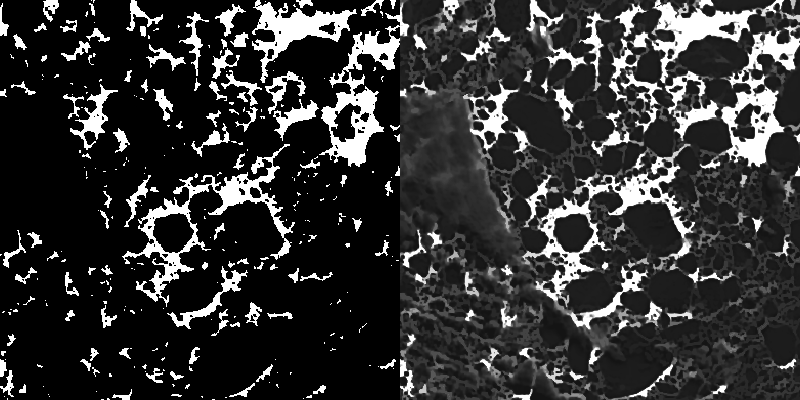

In [148]:
mosaicview(Gray.(darken_mask), Gray.(reconstructed_complement), nrow=1)

In [149]:

img = reconstructed_complement
edges, counts = build_histogram(img, 64; minval=0, maxval=1)

(0.0:0.015625:0.984375, [0, 0, 0, 0, 0, 0, 15123, 24124, 29800, 10273  …  269, 87, 209, 265, 258, 233, 348, 261, 241, 15607])

In [150]:
# Adjust so that things below the lowest and largest peak are set to 0. This prevents ice from being darkened in the computation of the residue.
window=3
pks = findmaxima(counts, window) |> peakproms! |> peakwidths!
pks_df = DataFrame(pks[Not(:data)])
pks_df = sort(pks_df, :proms, rev=true)
mx, argmx = findmax(pks_df.proms)
new_min = edges[pks_df[argmx, :indices]]
adjust_histogram!(reconstructed_complement,LinearStretching((new_min, 0.95) => (0, 1)))


400×400 Matrix{Float32}:
 0.247759   0.247759   0.191778   0.215103     …  0.00517529   0.00517529
 0.215103   0.247759   0.219768   0.238428        0.000510231  0.00517529
 0.275749   0.345725   0.434361   0.345725        0.0          0.00517529
 0.420366   0.476347   0.743188   0.373715        0.0          0.0
 0.485677   0.555653   0.838356   0.182448        0.0          0.0
 0.495007   0.765581   0.838356   0.103142     …  0.0          0.00517529
 0.383045   0.838356   0.838356   0.0751512       0.00517529   0.00517529
 0.950317   0.983906   0.462352   0.056491        0.00517529   0.00517529
 1.0        1.0        0.112472   0.0331657       0.00517529   0.00517529
 1.0        0.933523   0.0331657  0.000510231     0.00517529   0.00517529
 1.0        0.765581   0.0145054  0.0          …  0.00517529   0.0
 1.0        0.754384   0.0285006  0.0             0.00517529   0.000510231
 1.0        1.0        0.0844814  0.0             0.00517529   0.00517529
 ⋮                               

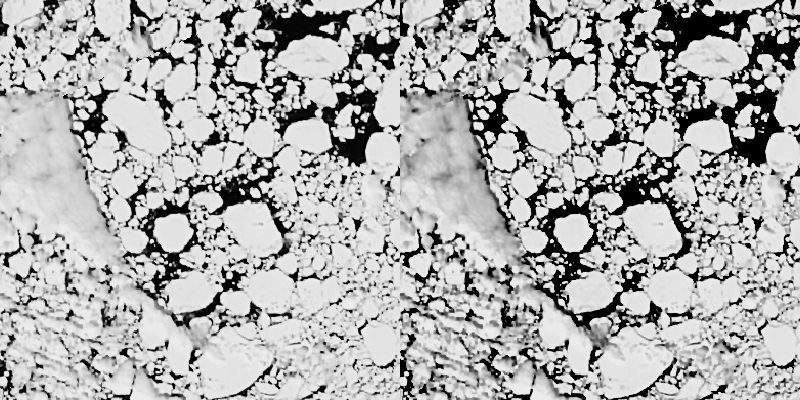

In [151]:
mosaicview(enhanced_gray, enhanced_gray .- reconstructed_complement, nrow=1)

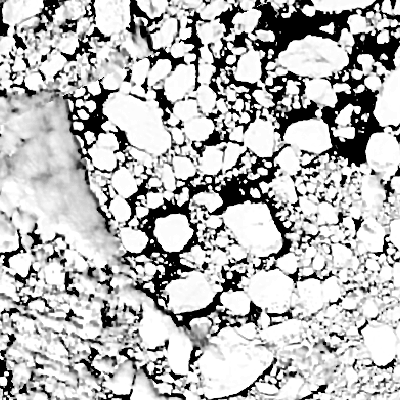

In [152]:
window=3
img = enhanced_gray .- reconstructed_complement
edges, counts = build_histogram(img, 64; minval=0, maxval=1)
pks = findmaxima(counts, window) |> peakproms! |> peakwidths!
pks_df = DataFrame(pks[Not(:data)])
pks_df = sort(pks_df, :proms, rev=true)
mx, argmx = findmax(pks_df.proms)
new_max = edges[pks_df[argmx, :indices]]
test_img = adjust_histogram(img, LinearStretching((0, new_max) => (0, 1)))
Gray.(adjust_histogram(img, LinearStretching((0, new_max) => (0, 1))))

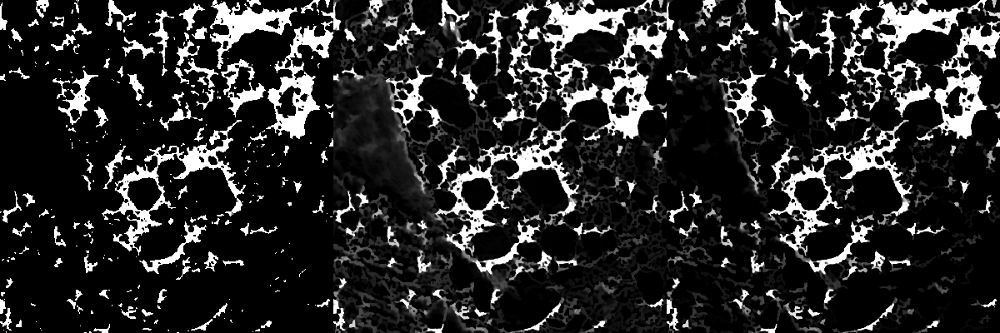

In [153]:

mosaicview(Gray.(darken_mask), Gray.(reconstructed_complement),
    Gray.(adjust_histogram(reconstructed_complement,LinearStretching((new_min, 0.95) => (0, 1)))),
    nrow=1)

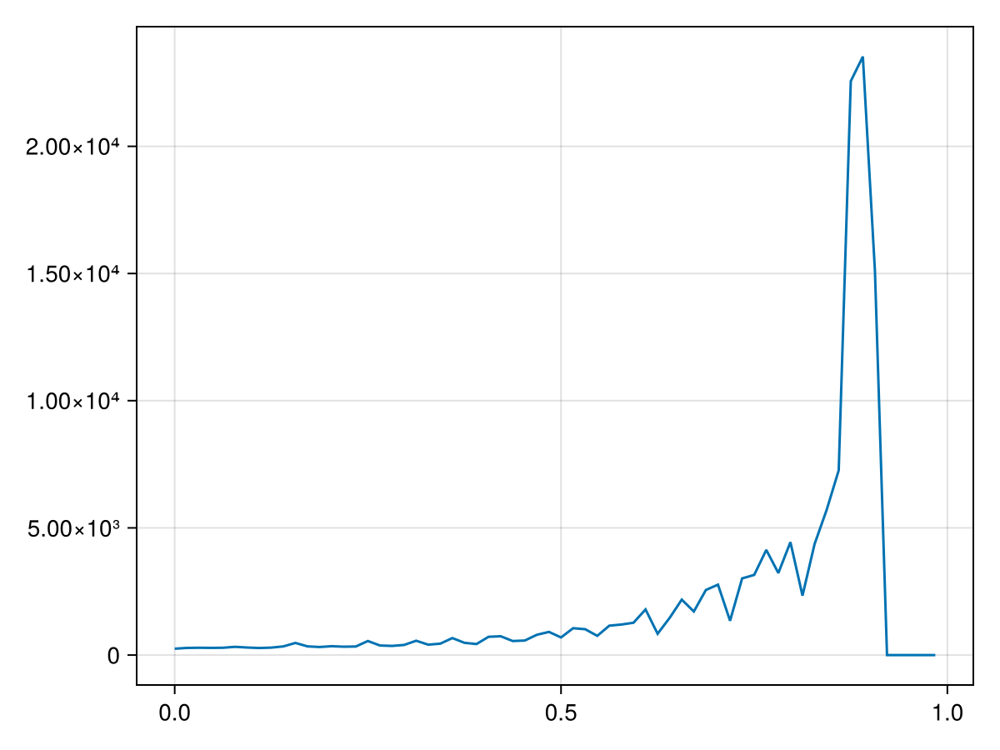

In [154]:
lines(edges, counts[1:end])

In [155]:
using StatsBase

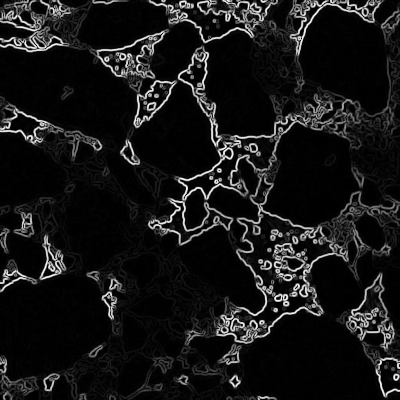

In [156]:
Gx, Gy = imgradients(equalized_gray_sharpened_reconstructed,  KernelFactors.sobel, "replicate")
gmag = hypot.(Gx, Gy)
for tile in tiles
    gmag[tile...] .= gmag[tile...] ./ maximum(gmag[tile...]) # local max, smoothed?
end
Gray.(gmag)

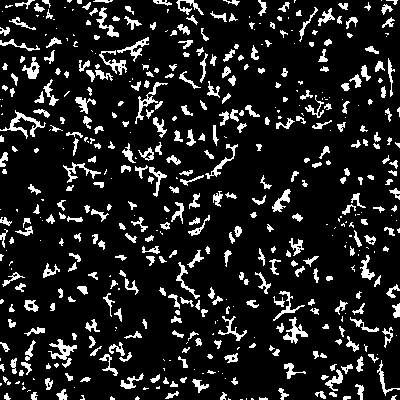

In [157]:
local_max = ImageMorphology.local_maxima(equalized_gray_sharpened_reconstructed; connectivity=1) .> 0;
Gray.(local_max)

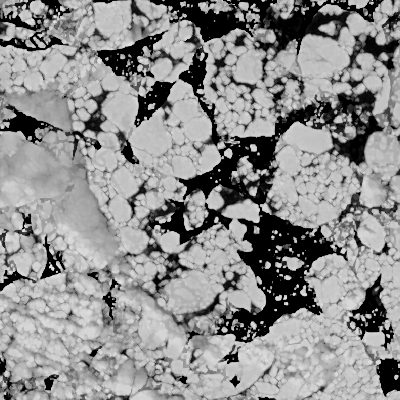

In [158]:
morphed_residue = dilate(Gray.(tc_img), strel_diamond((3,3))) .- equalized_gray_sharpened_reconstructed

In [173]:
using Random

segments = zeros(Int64, size(tc_img))
k = 4
for tile in tiles
    segments[tile...] = IceFloeTracker.kmeans_segmentation(float64.(test_img[tile...]), k=k)
end
# Produce an image by replacing values inside a segment with the segment mean color
function view_seg(s)
    map(i->segment_mean(s,i), labels_map(s))
end
# Return a random color of type RGB{N0f8}
function get_random_color(seed)
    Random.seed!(seed)
    rand(RGB{N0f8})
end

# Produce an image by replacing values inside a segment with the segment mean color
function view_seg(s)
    map(i->segment_mean(s,i), labels_map(s))
end

# Assign random colors to each segment (useful if viewing cluster results)
function view_seg_random(s)
    map(i->get_random_color(i), labels_map(s))
end
# add the tiled adaptive binarization
function tiled_adaptive_binarization(img, tiles; minimum_window_size=50, minimum_brightness=75/255, threshold_percentage=15)
    canvas = zeros(size(img))
    img = deepcopy(img)
    img[Gray.(img) .< minimum_brightness] .= 0
    for tile in tiles
        L = Int64.(round.(minimum(length.(tile)) / 8, digits=0))
        L < minimum_window_size && (L = minimum_window_size)

        f = AdaptiveThreshold(img[tile...], window_size = L, percentage = threshold_percentage)
        canvas[tile...] = binarize(img[tile...], f)
    end
    
    # possibly overkill
    canvas[Gray.(img) .< minimum_brightness] .= 0 
    return canvas
end




tiled_adaptive_binarization (generic function with 1 method)

In [174]:
include("../scripts/dev/segmentation.jl")

stitch_clusters (generic function with 3 methods)

In [175]:
bin_img = tiled_adaptive_binarization(enhanced_gray, tiles;
    minimum_window_size=400, minimum_brightness=0.3 , threshold_percentage=0);
tc_seg = SegmentedImage(tc_img, label_components(segments))
tc_seg_stitched = SegmentedImage(tc_img, label_components(stitch_clusters(tiles, tc_seg)))
bdry_seg = SegmentedImage(gmag, tc_seg_stitched.image_indexmap)
local_max_seg = SegmentedImage(bin_img, tc_seg_stitched.image_indexmap)
gray_seg = SegmentedImage(enhanced_gray, tc_seg_stitched.image_indexmap)

Segmented Image with:
  labels map: 400×400 Matrix{Int64}
  number of labels: 8913

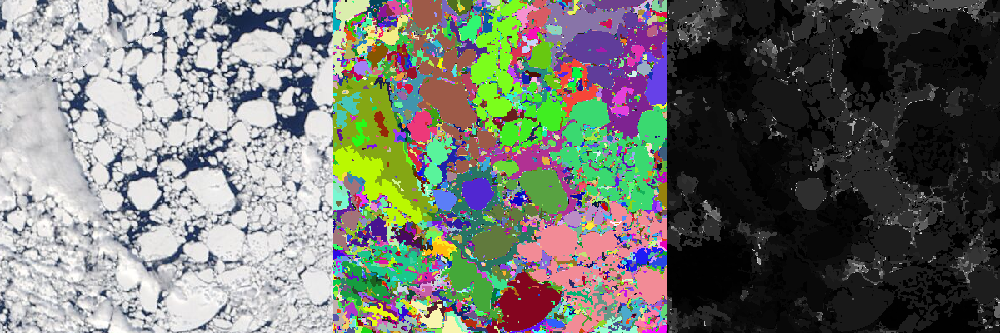

In [176]:
mosaicview(tc_img, view_seg_random(tc_seg_stitched), view_seg(bdry_seg), nrow=1)

In [177]:
# Categories: 
# Water (tc_img mean red channel l

# Remove segments if they are more than 10 percent boundary pixels and they are smaller than 10 pixels
rem_labels = [s for s in bdry_seg.segment_labels if (bdry_seg.segment_means[s] > 0.1 && bdry_seg.segment_pixel_count[s] < 10)];

In [178]:
# Keep labels if they are more than 50% bright ice pixels and larger than 10 pixels
keep_labels = [s for s in segment_labels(gray_seg)
                    if segment_mean(gray_seg, s) > 0.5 && 
                       segment_pixel_count(gray_seg, s) > 10];

In [179]:
length(rem_labels)
diff_fn(rlab, nlab) = segment_mean(bdry_seg, nlab) - segment_mean(bdry_seg, rlab);
new_seg = prune_segments(bdry_seg, rem_labels, diff_fn);

new_map = zeros(Int64, size(gray_seg.image_indexmap))
for ii in keep_labels
    idx = gray_seg.image_indexmap .== ii
    new_map[idx] .= ii
end

small_objects = zeros(Int64, size(gray_seg.image_indexmap))
for ii in keep_labels
    if segment_pixel_count(gray_seg, ii) < 64
        idx = gray_seg.image_indexmap .== ii 
        small_objects[idx] .= ii
    end
end


test_seg = SegmentedImage(tc_img, new_map)

Segmented Image with:
  labels map: 400×400 Matrix{Int64}
  number of labels: 864

So what we have so far is
- kmeans to get potential image segments
- gradients to get the boundary pixels and remove those from consideration
- fraction of bright ice pixels to get possible ice floes

Next, I want to
- check each floe on whether it is foreground or background by comparing the mean brightness to the brightness of it's boundary. So that could be done by grabbing the object, padding it, selecting the enhanced grayscale image intersecting with the dilated padded object, and checking if it is at least some threshold brighter. If not, call it background.
- Fill holes based on a distance transform method. A melt pond in the center of a floe, for example, is a dark patch with no neighbors nearby. So we could use a region adjacency graph to look for segments with only one neighbor.
- Then use the watershed segmentation to separate large floes.

Question: what would be the right way to merge floes together again?

Clockwise from top left: True color, gradients averaged in segments, fraction of binarized image within floes, random colors of the stitched TC seg, segment colors for the grayscale seg, and random colors after pruning boundaries.

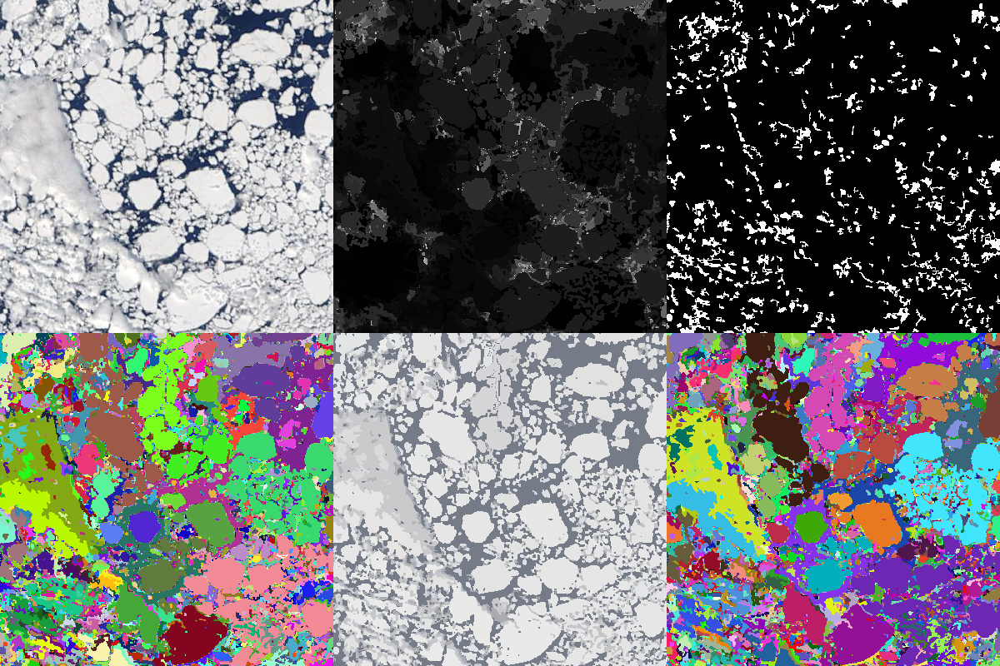

In [180]:
print("Clockwise from top left: True color, gradients averaged in segments, fraction of binarized image within floes, random colors of the stitched TC seg, segment colors for the grayscale seg, and random colors after pruning boundaries.")
mosaicview(tc_img, view_seg_random(tc_seg_stitched), view_seg(bdry_seg),
            view_seg(test_seg), Gray.(small_objects .> 0), view_seg_random(new_seg), nrow=2)

If we consider the distance to objects of a different type, we can use that information to distinguish between shadows and melt points within large floes vs the bits of noisy boundary fragments in the interstitial ice. 

In [168]:
length(keep_labels)

998

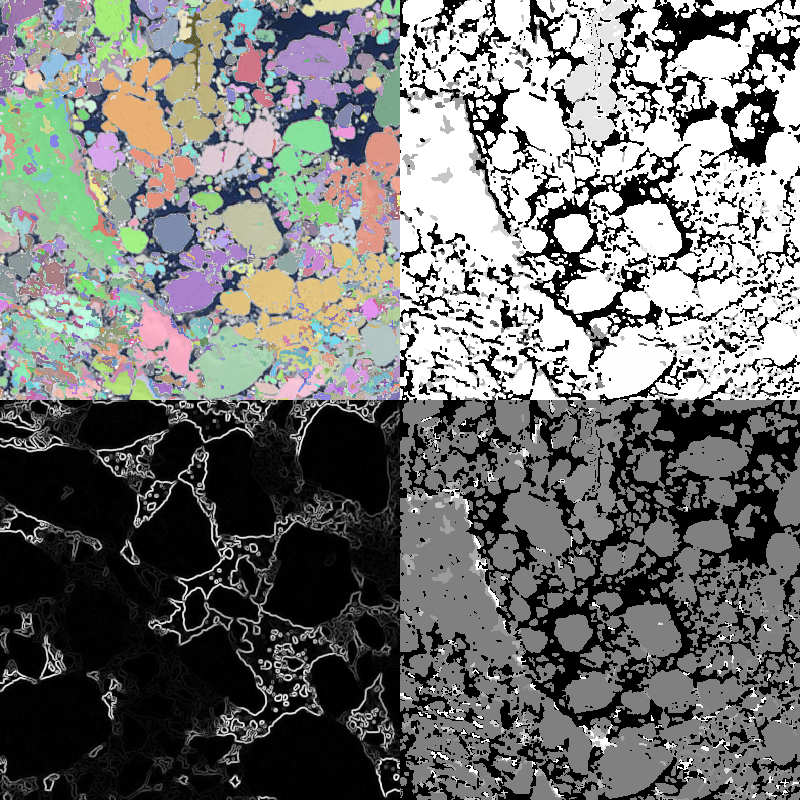

In [169]:
tc_img_cp = deepcopy(tc_img)
test_overlay = view_seg_random(test_seg) .* (new_map .!= 0)
tc_img_cp[new_map .!= 0] .= 0.5 .* test_overlay[new_map .!= 0] .+ 0.5 .* tc_img_cp[new_map .!= 0]
mosaicview(tc_img_cp, gmag, view_seg(local_max_seg), Gray.(test_seg.image_indexmap .> 0) .- 0.5 .* view_seg(local_max_seg),  nrow=2)

So - does the segmentation help us more than the binarization does? What can I do with the edge gradient information? Tag and watershed? Use Ellen's / Alexis' method?

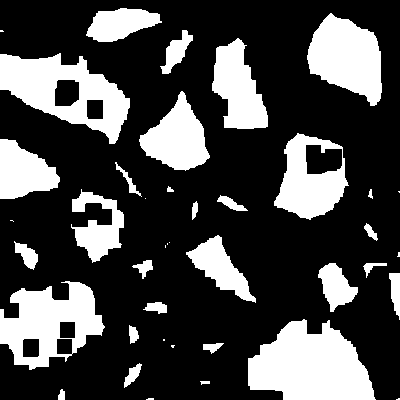

In [244]:
Gray.(IceFloeTracker.erode(view_seg(local_max_seg) .> 0.9, strel_box((15,15))))

In [120]:
length(segment_labels(new_seg))

2452

In [121]:
rem_labels = [s for s in segment_labels(new_seg) if segment_pixel_count(new_seg, s) < 64]
diff_fn(rlab, nlab) = segment_mean(gray_seg, nlab) - segment_mean(gray_seg, rlab)
new_seg2 = prune_segments(bdry_seg, rem_labels, diff_fn);

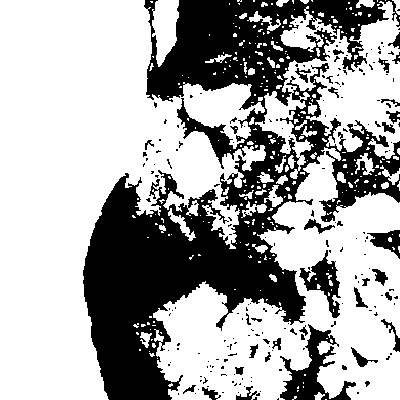

In [122]:
Gray.(view_seg(gray_seg) .> 0.5)

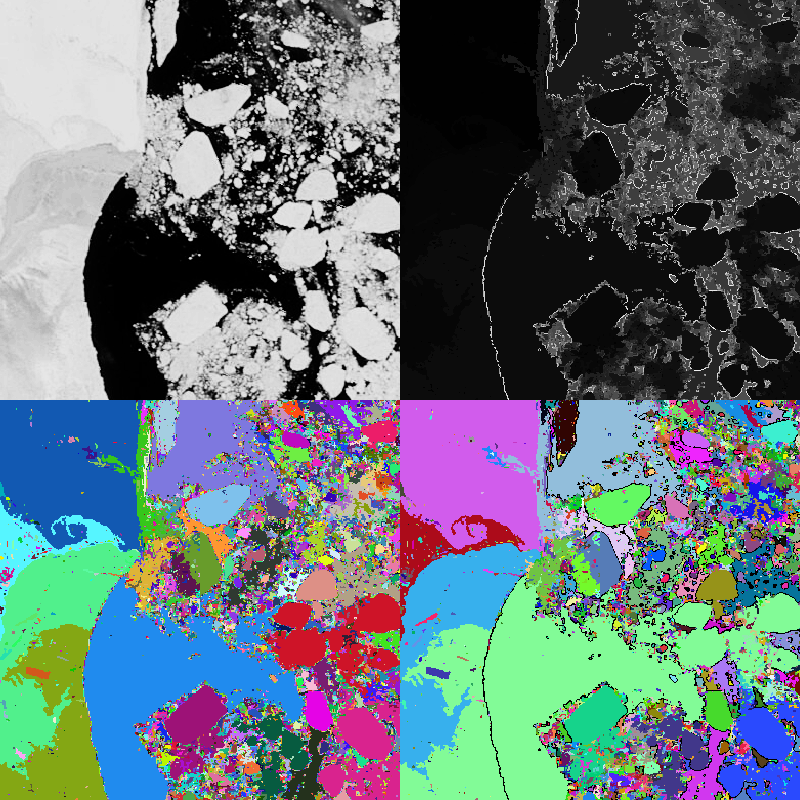

In [130]:
mosaicview(tc_gray,
    view_seg_random(tc_seg_stitched), view_seg(new_seg2), view_seg_random(new_seg2) .* (view_seg(bdry_seg) .< 0.5), nrow=2)

[ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80] (cache misses: wrong dep version loaded (4), incompatible header (8), mismatched flags (2))
[ Info: Precompiling FileIOExt [f5f51d8f-5827-5d2e-939b-192fcd6ec70c] (cache misses: wrong dep version loaded (4), incompatible header (8), mismatched flags (2))
[ Info: Precompiling UnitfulExt [0e51ec96-f580-5f12-a625-1297083d7970] (cache misses: wrong dep version loaded (2), incompatible header (8))
[ Info: Precompiling GeometryBasicsExt [b238bd29-021f-5edc-8b0e-16b9cda5f63a] (cache misses: wrong dep version loaded (2), incompatible header (8))
[ Info: Precompiling IJuliaExt [2f4121a4-3b3a-5ce6-9c5e-1f2673ce168a] (cache misses: wrong dep version loaded (2), incompatible header (6))


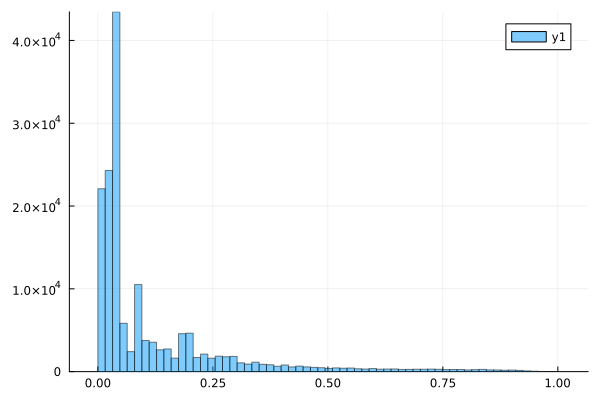

In [84]:
using Plots
histogram(vec(Float64.(Gray.(view_seg(bdry_seg)))), bins=range(0, 256, 64) ./ 255, alpha=0.5)

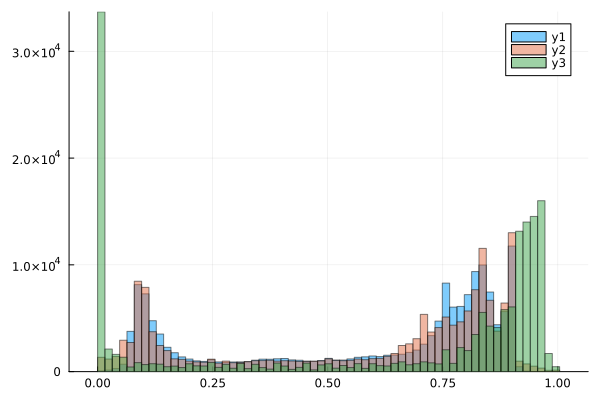

In [342]:
histogram(vec(Float64.(Gray.(tc_img))), bins=range(0, 256, 64) ./ 255, alpha=0.5)
histogram!(vec(Float64.(Gray.(tc_diffused_sharpened))), bins=range(0, 256, 64) ./ 255, alpha=0.5)
histogram!(vec(Float64.(Gray.(test))), bins=range(0, 256, 64) ./ 255, alpha=0.5)

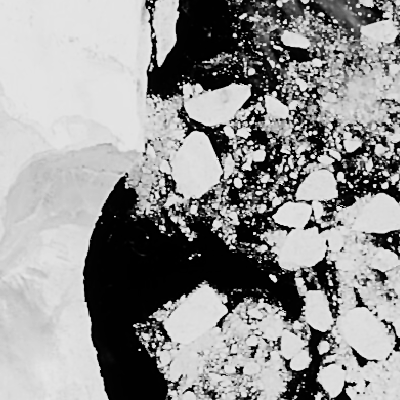

In [261]:
adjust_histogram(Gray.(tc_diffused_sharpened), ContrastStretching(slope=3.5))

In [217]:
tc_img = load("../../IceFloeTracker.jl/test/test_inputs/beaufort-chukchi-seas_truecolor.2020162.aqua.250m.tiff")
fc_img = load("../../IceFloeTracker.jl/test/test_inputs/beaufort-chukchi-seas_falsecolor.2020162.aqua.250m.tiff")
cloud_mask = IceFloeTracker.create_cloudmask(fc_img, new_cmask)
land_mask = IceFloeTracker.create_landmask(load("../../IceFloeTracker.jl/test/test_inputs/landmask.tiff"), strel_diamond((11,11)))
cloud_mask = cloud_mask .* land_mask.non_dilated;

In [218]:
tiles = IceFloeTracker.get_tiles(tc_img, 200)
tile_markers = zeros(size(cloud_mask))
filtered_tiles = filter(t -> filter_function(tc_img[t...], fc_img[t...], cloud_mask[t...], .!land_mask.dilated[t...]), tiles)
for tile in filtered_tiles
    tile_markers[tile...] .= 1
end

In [220]:
@time tc_diffused_sharpened_init = nonlinear_diffusion(deepcopy(tc_img), pmd_diff) |> unsharp_mask;

  0.078059 seconds (1.98 k allocations: 417.855 MiB, 5.08% gc time)


In [221]:
@time begin
    tc_diffused_sharpened2 = deepcopy(tc_img)
    for tile in filtered_tiles
        tc_diffused_sharpened2[tile...] .= nonlinear_diffusion(deepcopy(tc_img)[tile...], pmd_diff) |> unsharp_mask
    end
end

  0.093519 seconds (7.61 k allocations: 422.995 MiB, 7.15% gc time)


In [222]:
@time begin
    tc_diffused_sharpened = deepcopy(tc_img)
    for tile in tiles
        tc_diffused_sharpened[tile...] .= nonlinear_diffusion(deepcopy(tc_img)[tile...], pmd_diff) |> unsharp_mask
    end
end
nothing

  0.093710 seconds (7.61 k allocations: 422.995 MiB, 8.14% gc time)


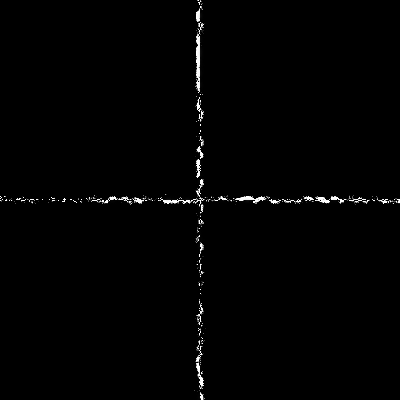

In [223]:
Gray.(abs.(tc_diffused_sharpened_init .- tc_diffused_sharpened))

In [224]:
maximum(abs.(Float64.(Gray.(tc_diffused_sharpened_init)) .- Float64.(Gray.(tc_diffused_sharpened))))

0.0784313725490196

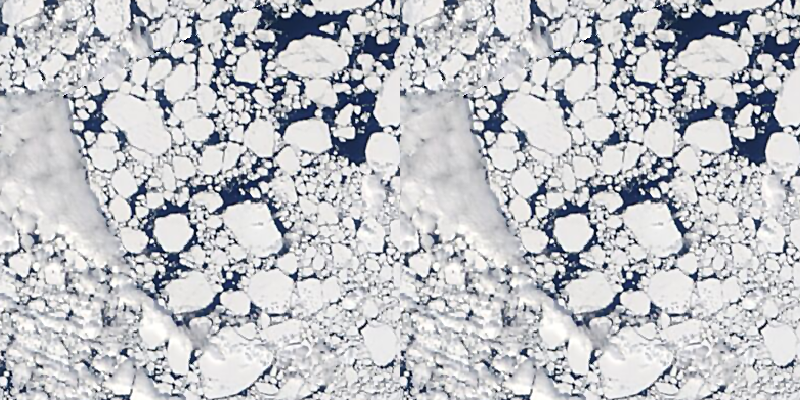

In [227]:
mosaicview(tc_diffused_sharpened_init, tc_diffused_sharpened, nrow=1)

In [196]:
length(tiles), length(filtered_tiles)

(902, 472)

  1.763934 seconds (2.23 M allocations: 1.356 GiB, 15.36% gc time, 16.94% compilation time)


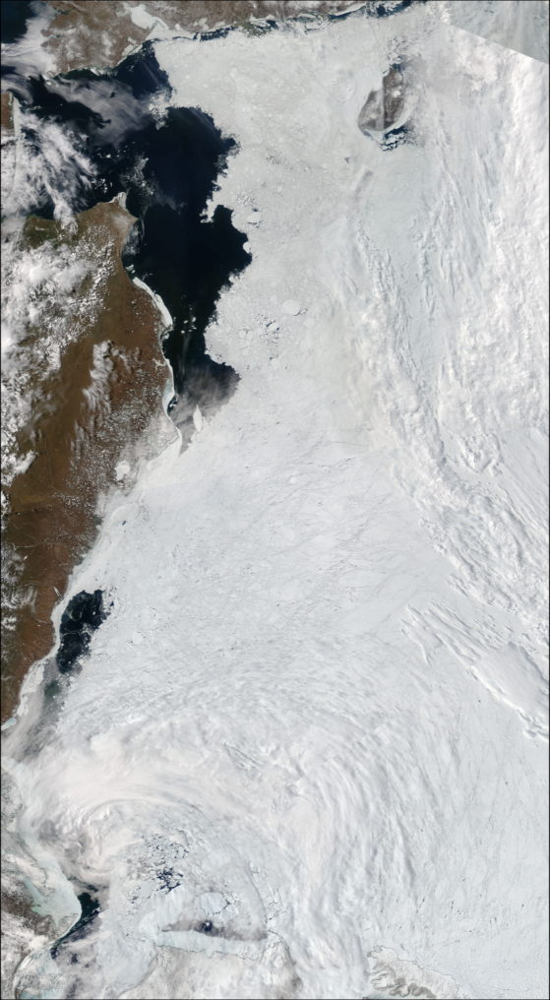

In [197]:
@time adjust_histogram(tc_diffused_sharpened, f)

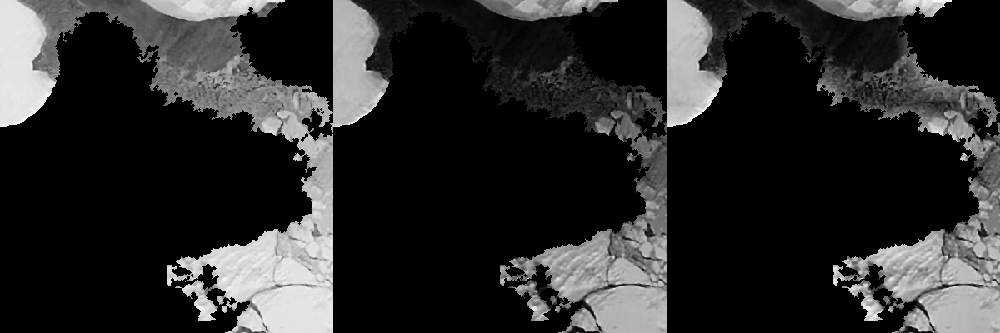

In [180]:
f = AdaptiveEqualization(;nbins=256, rblocks=8, cblocks=8, clip=0.99)
gc = GammaCorrection(gamma=3)
mosaicview(Gray.(tc_diffused_sharpened), adjust_histogram(Gray.(tc_diffused_sharpened), gc), 
    adjust_histogram(adjust_histogram(Gray.(tc_diffused_sharpened), gc), f), nrow=1)

In [138]:
# Reconstruction
# markers = closing(binarize(Gray.(tc_diffused_sharpened), AdaptiveThreshold(window_size=200, percentage=0)))
# reconstructed = mreconstruct(dilate, complement.(markers), complement.(Gray.(tc_diffused_sharpened)))
# # reconstructed = adjust_histogram(reconstructed, G())
# Gray.(tc_diffused_sharpened) .- reconstructed

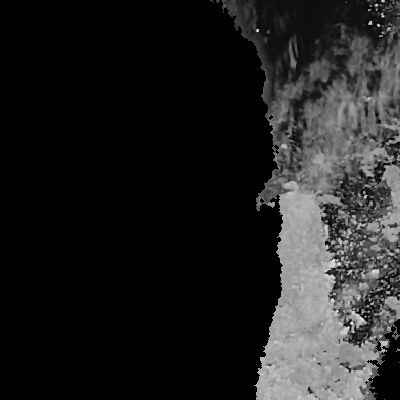

In [167]:
bin_img = opening(binarize(Gray.(tc_diffused_sharpened), AdaptiveThreshold(window_size=200, percentage=0)))
test = Gray.(tc_diffused_sharpened)
test[bin_img .== 0] .= 0.9 .* test[bin_img .== 0]
Gray.(test)

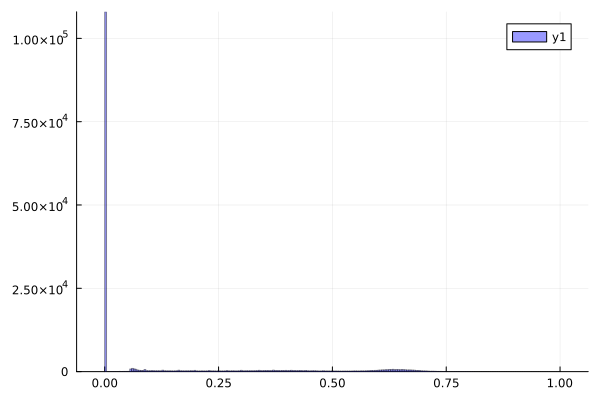

In [175]:
using Plots
bins = range(0, 1, 256)
histogram(vec(Float64.(test)), color=:blue, alpha=0.4, bins=bins)

# histogram!(vec(Float64.(adjust_histogram(Gray.(tc_diffused_sharpened), f))), color=:red, alpha=0.4, bins=bins)